In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os
import cv2
from glob import glob
import random
import torch
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
from torch import nn
import random

In [26]:
data_root_dir = "../datasets/waterbird"
grad_cam_dir = "../../../Download/Waterbird/Swin-base/Grad-Cam"

grad_cam_metadata = pd.read_csv(os.path.join(grad_cam_dir, "metadata.csv"))
grad_cam_metadata.head(5)

,img_filename,cam_filename,y,place,prediction
0,001.Black_footed_Albatross/Black_Footed_Albatr...,0_Black_Footed_Albatross_0046_18.jpg,1,1,1
1,001.Black_footed_Albatross/Black_Footed_Albatr...,1_Black_Footed_Albatross_0002_55.jpg,1,0,1
2,001.Black_footed_Albatross/Black_Footed_Albatr...,2_Black_Footed_Albatross_0085_92.jpg,1,1,1
3,001.Black_footed_Albatross/Black_Footed_Albatr...,3_Black_Footed_Albatross_0025_796057.jpg,1,1,1
4,001.Black_footed_Albatross/Black_Footed_Albatr...,4_Black_Footed_Albatross_0086_796062.jpg,1,0,1


In [27]:
LANDBIRD = 0
WATERBIRD = 1
LAND = 0
WATER = 1

In [28]:
def plot_heatmap(landbird_on_land,
                 landbird_on_water,
                 waterbird_on_water,
                 waterbird_on_land,
                 title):

    nrows, ncols = 4, 10
    fig = plt.figure(figsize=(25, 40))
    img_size = (500, 500)

    subfigs = fig.subfigures(nrows, 1)
    subfig_titles = ['landbird on land', 'landbird on water',
                     'waterbird on water', 'waterbird on land']

    for subfig, subtitle, entry in zip(subfigs, subfig_titles, [landbird_on_land, landbird_on_water, waterbird_on_water, waterbird_on_land]):

        axs = subfig.subplots(4, ncols)
        subfig.suptitle(subtitle, fontsize=17,  ha='center',
                        va='top', x=0.5, y=0.94)
        idx = 0

        for i in range(ncols):
            img_path = os.path.join(data_root_dir, entry[idx][0])
            img = Image.open(img_path).convert('RGB').resize(img_size)
            axs[0, i].imshow(img)
            axs[0, i].axis('off')
            # axs[0, i].set_title(f"true: {entry[idx]['img_label']} | pred: {entry[idx]['predicted']}")

            heatmap_path = os.path.join(os.path.join(grad_cam_dir, entry[idx][1]))
            heatmap = Image.open(heatmap_path).convert('RGB').resize(img_size)
            axs[1, i].imshow(heatmap)
            axs[1, i].axis('off')

            img_path = os.path.join(data_root_dir, entry[idx + ncols][0])
            img = Image.open(img_path).convert('RGB').resize((500, 500))
            axs[2, i].imshow(img)
            axs[2, i].axis('off')
            # axs[2, i].set_title(f"true: {entry[idx + ncols]['img_label']} | pred: {entry[idx + ncols]['predicted']}")


            heatmap_path = os.path.join(os.path.join(grad_cam_dir, entry[idx + ncols][1]))
            heatmap = Image.open(heatmap_path).convert('RGB').resize(img_size)
            axs[3, i].imshow(heatmap)
            axs[3, i].axis('off')
            idx += 1
    

    fig.suptitle(title, fontsize=20,
                 ha='center', va='top', x=0.5, y=1.01)
    plt.subplots_adjust(hspace=0.01, wspace=0.01)
    plt.show()

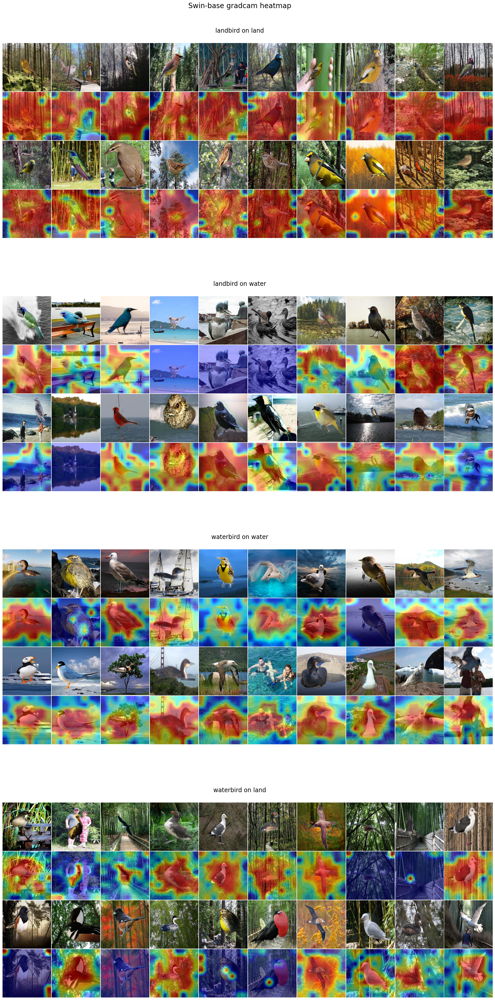

In [32]:
landbird_on_land = []
landbird_on_water = []
waterbird_on_land = []
waterbird_on_water = []

for i, row in grad_cam_metadata.iterrows():
    if row['y'] == LANDBIRD and row['place'] == LAND:
        landbird_on_land.append(row.values)

    elif row['y'] == LANDBIRD and row['place'] == WATER:
        landbird_on_water.append(row.values)

    elif row['y'] == WATERBIRD and row['place'] == LAND:
        waterbird_on_land.append(row.values)
        

    elif row['y'] == WATERBIRD and row['place'] == WATER:
        waterbird_on_water.append(row.values)

random.shuffle(landbird_on_land)
random.shuffle(landbird_on_water)
random.shuffle(waterbird_on_land)
random.shuffle(waterbird_on_water)
# print(len(landbird_on_land), len(landbird_on_water), len(waterbird_on_water), len(waterbird_on_water))


plot_heatmap(landbird_on_land,
             landbird_on_water,
             waterbird_on_water,
             waterbird_on_land,
             title='Swin-base gradcam heatmap')